# CS 591 S1 -- Summer 1, 2020 -- HW 02A


### Due date: Due Thursday, June 18th, @ midnight in GradeScope with 2 day grace period


### General Instructions

Please complete this notebook by filling in solutions where indicated. Be sure to "Run All" from the Cell menu before submitting. 

 
 

In [3]:
# General useful imports
import array as ar
import contextlib
import wave
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import Audio

from numpy import arange,linspace,mean, var, std, corrcoef, cov, transpose, ones,log,pi, sin, cos, exp, abs, angle, convolve
from numpy.random import random, randint, uniform
from scipy import signal
from scipy.interpolate import interp1d

%matplotlib inline

# Basic parameters for reading and writing mono wave files

numChannels   = 1                      # mono
sampleWidth   = 2                      # in bytes, a 16-bit short
SR            = 44100                  #  sample rate
MAX_AMP       = (2**(8*sampleWidth - 1) - 1)    #maximum amplitude is 2**15 - 1  = 32767
MIN_AMP       = -(2**(8*sampleWidth - 1))       #min amp is -2**15
windowWidth   = 4410
windowSlide   = 2205


def round4(x):
    return np.around(x,4)

def round2(x):
    return np.around(x,2)

# Basic Numpy statistical functions

X = np.array([1,2,3])       # just an example
Y = np.array([4,5,6])
             
# mean of a list
mean(X)                            

# Clip a signal or a scalar to upper and lower bounds, if not specified, us
# bounds provided above; will change the array in place and return it.
# Does NOT make a new copy. 

def clip(X,lb=MIN_AMP,ub=MAX_AMP):
    
    if type(X) != list and type(X) != np.ndarray:
        return max(min(X,MAX_AMP),MIN_AMP)
    
    for k in range(len(X)):
        X[k] = max(min(X[k],MAX_AMP),MIN_AMP)
    return X

# To prevent clipping, this function takes a signal and scales it so the max amplitude
# is A; the result is coerced back into integers

def scaleSignal(X,A=MAX_AMP):
    s = A/max(X)
    return np.array( [ x*s for x in X ] ).astype(int)

# default is not to standardize the amplitude, if want scaled down or up set
# relative amp

def makeSignal(S=[(220,1,0)], amp=None, duration=1):
    X = np.zeros(int(SR*duration))  
    for (f,A,phi) in S:         
        X += [ (MAX_AMP * A) * np.sin( 2 * pi * f * k / SR + phi ) for k in range(len(X)) ]
    if amp == None:
        return X.astype(int) 
    else:
        return ((X / max(X)) * MAX_AMP * amp).astype(int) 
    
    
# some useful spectra    

def makeSpectrum(instr,freq=220):
    if(instr=="triangle"):
        return ([(freq,1.0,0.0),    
        (freq*3,-1/(9),0.0), 
        (freq*5,1/(25),0.0), 
        (freq*7,-1/(49),0.0), 
        (freq*9,1/(81),0.0), 
        (freq*11,-1/(121),0.0), 
        (freq*13,1/(13*13),0.0)])
    elif(instr=="square"):
        return ([(freq,2/(np.pi),0.0), 
        (freq*3,2/(3*np.pi),0.0), 
        (freq*5,2/(5*np.pi),0.0), 
        (freq*7,2/(7*np.pi),0.0), 
        (freq*9,2/(9*np.pi),0.0), 
        (freq*11,2/(11*np.pi),0.0), 
        (freq*13,2/(13*np.pi),0.0),
        (freq*15,2/(15*np.pi),0.0),
        (freq*17,2/(17*np.pi),0.0),
        (freq*19,2/(19*np.pi),0.0),
        (freq*21,2/(21*np.pi),0.0)])
    elif(instr=="clarinet"):
        return ([(freq,0.314,0.0), 
        (freq*3,.236,0.0), 
        (freq*5,0.157,0.0), 
        (freq*7,0.044,0.0), 
        (freq*9,0.157,0.0), 
        (freq*11,0.038,0.0), 
        (freq*13,0.053,0.0)] ) 
    elif(instr=="bell"):
        return ([(freq,0.1666,0.0), 
        (freq*2,0.1666,0.0), 
        (freq*3,0.1666,0.0), 
        (freq*4.2,0.1666,0.0), 
        (freq*5.4,0.1666,0.0), 
        (freq*6.8,0.1666,0.0)])  
    elif(instr=="steelstring"):
        return ([(freq*0.7272, .00278,0.0),
        (freq, .0598,0.0),
        (freq*2, .2554,0.0),
        (freq*3, .0685,0.0),
        (freq*4, .0029,0.0),
        (freq*5, .0126,0.0),
        (freq*6, .0154,0.0),
        (freq*7, .0066,0.0),
        (freq*8, .0033,0.0),
        (freq*11.0455, .0029,0.0),
        (freq*12.0455, .0094,0.0),
        (freq*13.0455, .0010,0.0),
        (freq*14.0455, .0106,0.0),
        (freq*15.0455, .0038,0.0)])
    elif(instr=='organ'):
        return ([(freq*1, 0.16042589643241895, 0.0),
        (freq*2, 0.1655, 0.0),
        (freq*3, 0.0015, 0.0),
        (freq*3.9949, 0.02161, 0.0),
        (freq*5.9949, 0.04552, 0.0),
        (freq*7.9949, 0.0324, 0.0),
        (freq*9.9899, 0.00242, 0.0),
        (freq*11.9898, 0.0045, 0.0),
        (freq*17.9847, 0.0057, 0.0),
        (freq*19.9796, 0.0011, 0.0),
        (freq*27.9745, 0.0008, 0.0),
        (freq*29.9745, 0.0016, 0.0)]        
        )
    else:
        return []


In [4]:
# I/O for Wave files

# Read a mono wave file from a local file and return the entire file as a 1-D numpy array

def readWaveFile(infile,withParams=False,asNumpy=True):
    with contextlib.closing(wave.open(infile)) as f:
        params = f.getparams()
        frames = f.readframes(params[3])
        if(params[0] != 1):
            print("Warning in reading file: must be a mono file!")
        if(params[1] != 2):
            print("Warning in reading file: must be 16-bit sample type!")
        if(params[2] != 44100):
            print("Warning in reading file: must be 44100 sample rate!")
    if asNumpy:
        X = ar.array('h', frames)
        X = np.array(X,dtype='int16')
    else:  
        X = array.array('h', frames)
    if withParams:
        return X,params
    else:
        return X

# Write out an array as a wave file to the local directory
        
def writeWaveFile(X,fname):
    X = clip(X)
    params = [1,2, SR , len(X), "NONE", None]
    data = ar.array("h",X)
    with contextlib.closing(wave.open(fname, "w")) as f:
        f.setparams(params)
        f.writeframes(data.tobytes())
    print(fname + " written.")

In [5]:
# Display a graph of a signal

def displaySignal(X, left = 0, right = -1, minAmp=-1.2, maxAmp=1.2,title='Signal Window for X',signalRelative=False,xUnits = "Seconds", yUnits = "Relative",width=12, height=4):
    
    if(signalRelative):
        X = [x*MAX_AMP for x in X]
    minAmplitude = -(2**15 + 100)        # just to improve visibility of curve
    maxAmplitude = 2**15 + 300    
    
    if(xUnits == "Samples"):
        if(right == -1):
            right = len(X)
        T = range(left,right)
        Y = X[left:right]
    elif(xUnits == "Seconds"):
        if(right == -1):
            right = len(X)/44100
        T = np.arange(left, right, 1/44100)
        leftSampleNum = int(left*44100)
        Y = X[leftSampleNum:(leftSampleNum + len(T))]
    elif(xUnits == "Milliseconds"):
        if(right == -1):
            right = len(X)/44.1
        T = np.arange(left, right, 1/44.1)
        leftSampleNum = int(left*44.1)
        Y = X[leftSampleNum:(leftSampleNum + len(T))]
    else:
        print("Illegal value for xUnits")
        
    if(yUnits == "Relative"):
        minAmplitude = minAmp            # just to improve visibility of curve
        maxAmplitude = maxAmp
        Y = [x/32767 for x in Y]

    fig = plt.figure(figsize=(width,height))   # Set x and y dimensions of window: may need to redo for your display
    fig.suptitle(title, fontsize=14, fontweight='bold')
    ax = plt.axes()
    if(xUnits=="Samples"):
        ax.set_xlabel("Sample Number")
    else:
        ax.set_xlabel(xUnits)
    ax.set_ylabel(yUnits + ' Amplitude')
    ax.set_ylim([minAmplitude,maxAmplitude])
    ax.set_xlim([left, right])
    plt.axhline(0, color='black')      # draw the 0 line in black
    plt.plot(T,Y) 
    if(    (xUnits == "Samples" and (right - left) < 101)
        or (xUnits == "Seconds" and (right - left) < 0.001)
        or (xUnits == "Milliseconds" and (right - left) < 1) ):
            plt.plot(T,Y, 'ro')                     
    plt.grid(True)                     # if you want dotted grid lines
    plt.show()
    
f = 10
T = np.arange(SR*1)
X = MAX_AMP * np.sin(2*pi*f*T/SR)

# displaySignal(X)

In [6]:
# This will display a list of signals in aligned subplots, with separate titles

def plotSignals(signals, titles=[]):
    print()
    if titles == []:
        if len(signals) > 1:
            titles = ['Signal ' + str(k+1) + '\n' for k in range(len(signals))]
        else:
            titles = ['Signal\n']
    else:
        titles = [t + '\n' for t in titles]
            
    number_of_subplots=len(signals)
    
    N = len(signals[0])

    fig = plt.figure(figsize=(12,number_of_subplots*4))
    fig.subplots_adjust(hspace=0.75)
    #fig.suptitle("Comparison ",fontsize=16)
    
    for i,v in enumerate(range(number_of_subplots)):
        v = v+1
        ax1 = subplot(number_of_subplots,1,v)
        
        ax1.set_ylabel('Amplitude')
        ax1.set_xlabel('Time (ms)') 
        ax1.plot([0,N-1],[0,0],color='black',lw=0.75)
        ax1.plot([0,0],[-1,1],color='black',lw=0.75)    
        ax1.set_ylim([-1.2,1.2])
        plt.xlim([0,N-1])
        ax1.grid(color='0.75')
        ax1.plot(signals[i],color='b',lw=1)
        ax1.set_title(titles[i],fontsize=14)
    plt.show()

# Just an example
  
f = 10
T = np.arange(SR*1)
X10 = np.sin(2*pi*f*T/SR)
X20 = np.sin(2*pi*2*f*T/SR)
X30 = np.sin(2*pi*3*f*T/SR)
X40 = np.sin(2*pi*4*f*T/SR)

# plotSignals([X10,X20,X30,X40])

In [7]:
notenames = ['A0', 'Bb0', 'B0', 'C1', 'C#1', 'D1', 'Eb1', 'E1', 'F1', 'F#1',
       'G1', 'Ab1', 'A1', 'Bb1', 'B1', 'C2', 'C#2', 'D2', 'Eb2', 'E2',
       'F2', 'F#2', 'G2', 'Ab2', 'A2', 'Bb2', 'B2', 'C3', 'C#3', 'D3',
       'Eb3', 'E3', 'F3', 'F#3', 'G3', 'Ab3', 'A3', 'Bb3', 'B3', 'C4',
       'C#4', 'D4', 'Eb4', 'E4', 'F4', 'F#4', 'G4', 'Ab4', 'A4', 'Bb4',
       'B4', 'C5', 'C#5', 'D5', 'Eb5', 'E5', 'F5', 'F#5', 'G5', 'Ab5',
       'A5', 'Bb5', 'B5', 'C6', 'C#6', 'D6', 'Eb6', 'E6', 'F6', 'F#6',
       'G6', 'Ab6', 'A6', 'Bb6', 'B6', 'C7', 'C#7', 'D7', 'Eb7', 'E7',
       'F7', 'F#7', 'G7', 'Ab7', 'A7', 'Bb7', 'B7', 'C8', 'R']

# Create chromatic scale, e.g., as on the piano, as a dictionary    

Freqs = {} 

f = 27.5

for name in notenames:
    Freqs[name] = f
    f *= 2**(1/12)

Freqs['R'] = 0                    # a rest (silence) 

# test

Freqs['C4']

261.62556530059896

## Problem One: Amplitude Shaping with Sliding Window Analysis

We have one more possibility to explore with shaping the amplitude envelope of a signal, which is
to measure the actual amplitude envelope of a real signal, and then use the natural shape of the
note to shape other (perhaps synthesized) signals. 

In order to do this, we need to think about how to actually measure the amplitude in small segments regularly spaced across the signal. 

To analyze a (large) signal with $N$ samples, we usually measure a small "window" of the signal, 
perhaps 1000 to 10,000 samples (or about 20 - 200 milliseconds), to extract some useful measure
of a continuously-varying quantity or quantities.  Next week we will use this to extra spectra from
musical signals, but for now we will warm up with analyzing the amplitude envelope of a signal. 

### Sliding Window Analysis

In this form of signal analysis, we define two pointers to indices in the signal, delimiting a window of size $(hi - lo)$ samples, that is:

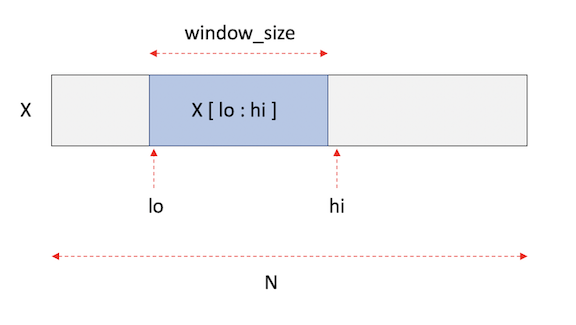


We will *slide* this window across the signal, moving it forward by a percentage of the window size each time; he is an example of a window size of 4410 samples (0.1 sec), moving forward by 50%, so that the next window overlaps the old by 50%:

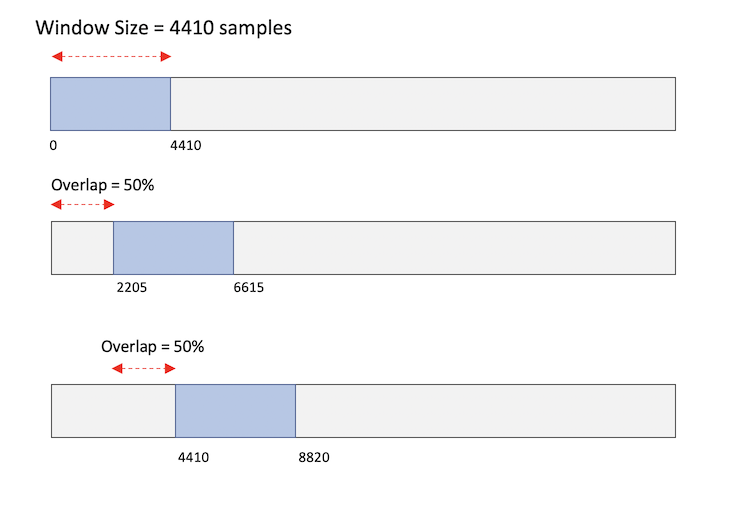


Windows do not *have* to overlap at all, for example we could set the overlap to 0.0:

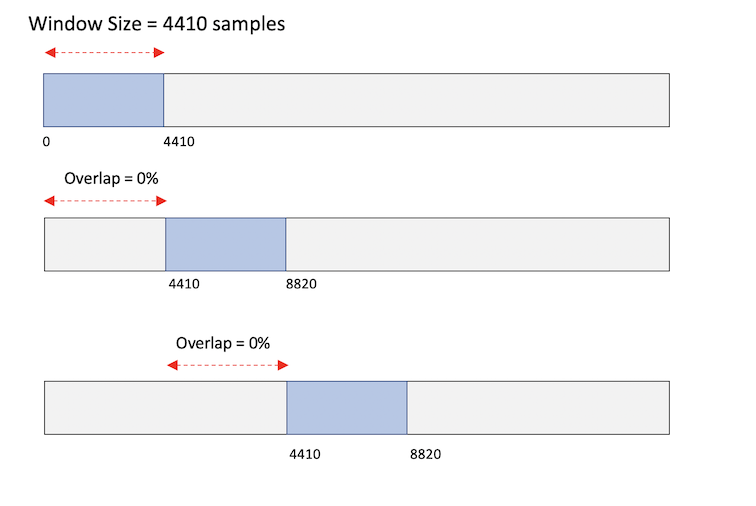

Typically, however, we overlap between 20% and 50% (50% is a typical overlap for the Fourier Transform, as we shall see next week). The reason we use a non-zero overlap is similar to the use of the *weighted moving average* we discussed last week: we do not want sharp edges or discontinuities in our envelope, so the overlap *smoothes* the transitions. 

### Part A:  Creating amplitude plots with sliding windows

Complete the template below to extract a sequence of relative amplitude numbers (in the range [0..1]) measuring the maximum amplitude in each window as it slides across the signal. 

At the end of the signal, the last couple of windows may not be complete (if the N/window_size is not an integer, and depending on the overlap), but you should still take the maximum of each and add it to the plot. (Usually, we will pick the overlap and window size so that this will not happen

You may take the maximum of the absolute values of the amplitudes if you wish, but the difference will not
be noticable. 


In [42]:
from math import ceil

def getAmplitudePlot(X, window_size=4410, overlap=0.5):
    left = 0             #starting left window bound
    right = window_size  #starting right window bound
    maxamps = np.array([])
    
    while right < len(X):   #loopsauce 
        window = X[left:right]   #create window
        largestfreq = abs(max(window))  #get largest freq from window
        maxamps = np.append(maxamps, largestfreq) #add to plot 
        right += int((1 - overlap) * window_size) #recreate bounds
        left = right - window_size                #.
    return maxamps / max(maxamps)

X = readWaveFile("bell.wav")
A = getAmplitudePlot( X )

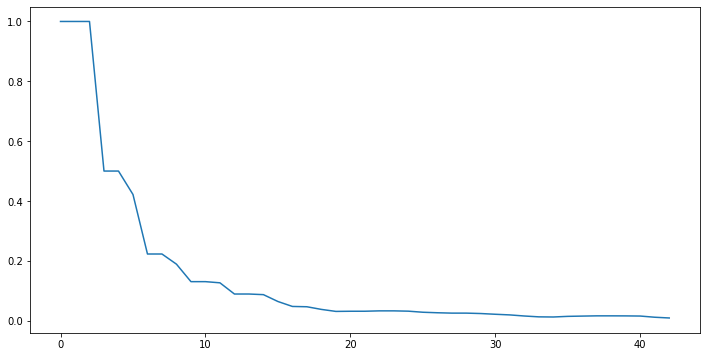

In [43]:
X = readWaveFile("bell.wav")
A = getAmplitudePlot( X )

plt.figure(figsize=(12,6))
plt.plot(A)
plt.show()

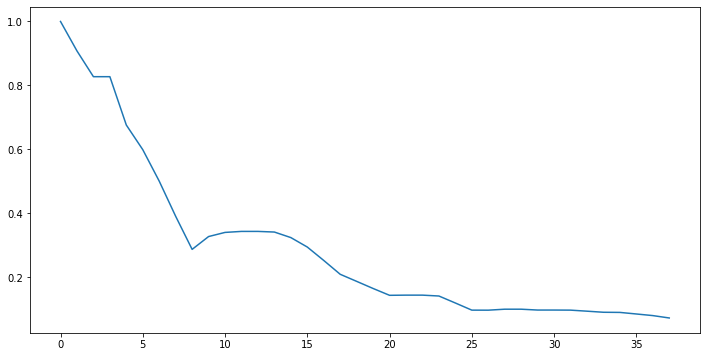

In [44]:
X = readWaveFile("steelstring.wav")
A = getAmplitudePlot( X )

plt.figure(figsize=(12,6))
plt.plot(A)
plt.show()

### Part B:  Creating Envelopes from Amplitude Plots by Interpolation

As discussed in lecture, we can use the function `interp1d` from the `scipy.interpolate` library to 
"resample" a signal or a function to fill in missing values. We did this by hand in HW 01, using
linear interpolation for the attack and decay phases, but now we will use quadratic interpolation
to create an envelope of relative amplitude values which we can multiply by the signal to get our
amplitude-modulated signal. 

**Before continuing with this part of the problem, please review *carefully* the Appendix in this notebook, which gives examples of how to use `interp1d`.** 


Fill in the following template to apply an amplitude plot to a signal, by interpolating between the values in the plot to obtain an envelope. 


In [9]:
def applyAmplitudePlot(A,X):
    
    T = np.linspace(0, len(A)-1, len(X))
    f = interp1d(range(len(A)), A, kind = 'quadratic')
    envelope = f(T)
    print(envelope)
    return envelope * X
    

[0.11197241 0.11198456 0.1119967  ... 0.0522241  0.05220538 0.05218665]


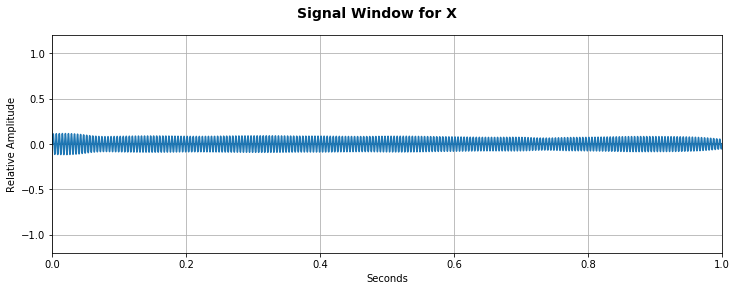

In [10]:
X = makeSignal()
A = getAmplitudePlot( readWaveFile("realClarinet440.wav") )
Y = applyAmplitudePlot( A, X )  

displaySignal(Y)
Audio(Y,rate=SR)

[0.79369488 0.7936362  0.79357753 ... 0.05698998 0.05698402 0.05697806]


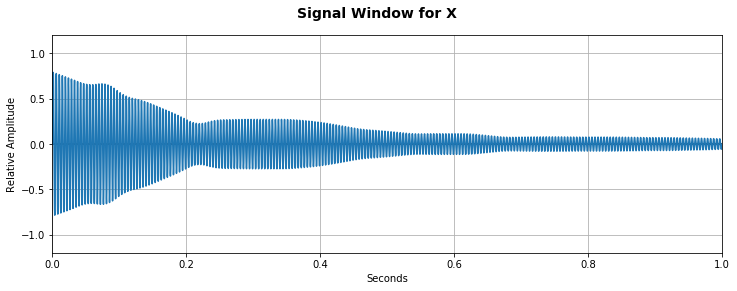

In [11]:
# Do the same for the steelstring.wav file
X = makeSignal()
A = getAmplitudePlot( readWaveFile("steelstring.wav") )
Y = applyAmplitudePlot( A, X )  

displaySignal(Y)
Audio(Y,rate=SR)

### Part C

Create an amplitude envelope from the `steelstring.wav` signal, then then "fill" it with a signal from the `steelstring` spectrum (as defined in the first cell). The frequency should be 220 Hz. 

Listen to both and compare!

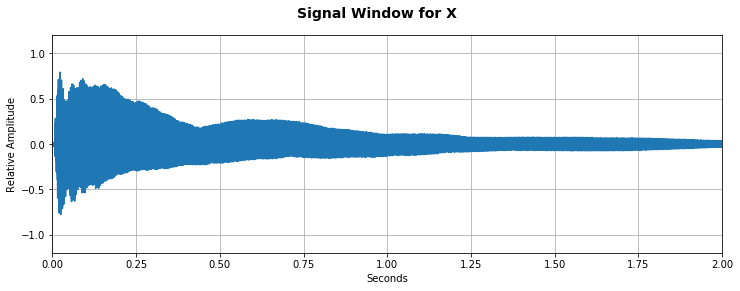

In [12]:
# Here's the original!
X = readWaveFile("steelstring.wav")
displaySignal(X)
Audio(X,rate=SR)

[0.79369488 0.79366554 0.7936362  ... 0.05698402 0.05698104 0.05697806]


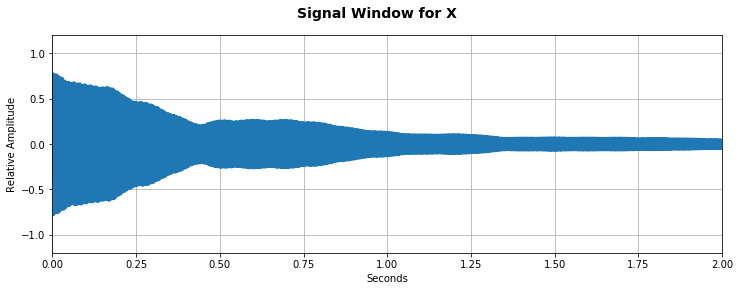

In [13]:
#  Your code here!
X = readWaveFile("steelstring.wav")
A = getAmplitudePlot(X)
X1 = makeSignal(makeSpectrum('steelstring', 220), amp = 1, duration = 2)
X2 = applyAmplitudePlot(A, X1)
displaySignal(X2)
Audio(X2,rate=SR)


### Part D

Do the same for the `realClarinet440.wav` signal. The frequency should be 440 Hz. Listen to both!

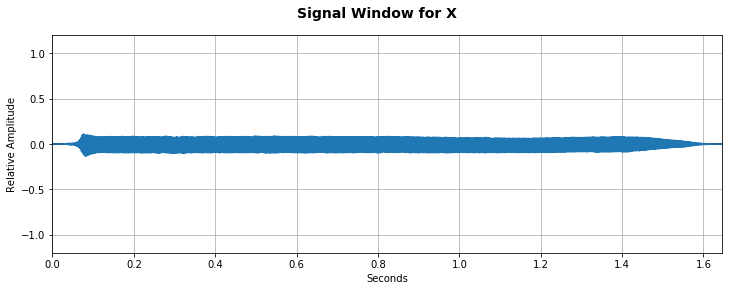

In [14]:
# Here's the original

X = readWaveFile("realClarinet440.wav")
displaySignal(X)
Audio(X,rate=SR)

[0.11197241 0.11197849 0.11198456 ... 0.05220538 0.05219601 0.05218665]


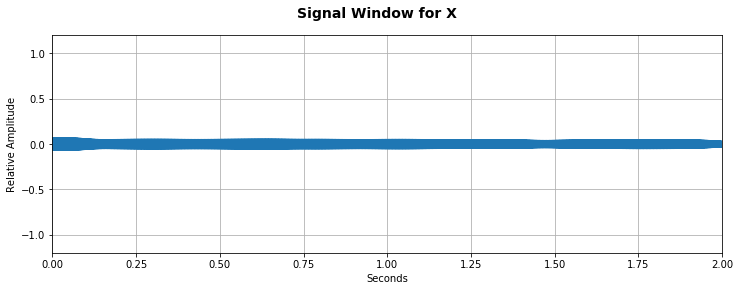

In [57]:
# Your code here

X = readWaveFile("realClarinet440.wav")
A = getAmplitudePlot(X)
X1 = makeSignal(makeSpectrum('clarinet', 440), duration = 2)
X2 = applyAmplitudePlot(A, X1)
displaySignal(X2)
Audio(X2,rate=SR)

### Part E

Do the same for the `bell.wav` signal. The frequency should be 8820 Hz. 

[1.         0.9999719  0.99994383 ... 0.00882105 0.00882045 0.00881985]


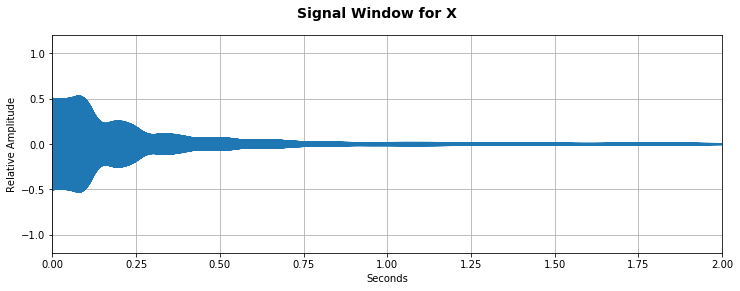

In [58]:
# Your code here
X = readWaveFile("bell.wav")
A = getAmplitudePlot(X)
X1 = makeSignal(makeSpectrum('bell', 8820), duration = 2)
X2 = applyAmplitudePlot(A, X1)
displaySignal(X2)
Audio(X2,rate=SR)

## Problem Two: Spectral Analysis by Smoothing and Peak Picking

As we discussed in lecture, instead of using a mathematical formula for determining what spectrum a, say, clarinet should have, why not record a clarinet and try to extract the spectrum from the signal?

Since there is a great deal of noise and other information (about timing for example) that is not strictly speaking related to the timbre of the instrument playing, an use approach would be to examine the "peaks" in the spectrum, which presumably represent important components of the timbre of the instrument. Determing exactly which
maxima in the signal represent such "peaks" is, naturally, the big problem. 



The maxima or <b>peaks</b> in any signal $A$ are locations $t$ at which 

$$A[t-1]\,\,<\,\, A[t] \,\, >\,\, A[t+1]$$

as shown in red at $t=2$ in the next figure:

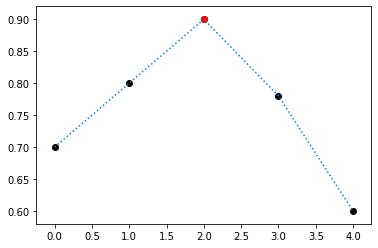

In [59]:
Y=[0.7,0.8,0.9,0.78,0.6]
X=[0,1,2,3,4]
plt.plot(X,Y,ls=':')
plt.scatter(X,Y,color='k')
plt.scatter([2],[0.9],color='r')
print()

### Part (A)

Fill in the following template, which takes a signal, and returns a list of points where peaks (maxima) occur,
as defined above. The points should be in the form of pairs of x,y values, i.e., $(t,A[t])$ for each $t$ where
a peak occurs. 

We will not consider the first or last value in the signal to be a peak, no matter how big it is,
since there has to be a smaller value on each side; keep this in mind when writing your for loop....

In [10]:
def findPeaks(A):
    maxima = []
    for t in range(1, len(A)-1):   
        prev = A[t - 1]
        curr = A[t]
        nexxtlol = A[t + 1]
        if  curr > prev and curr > nexxtlol:
            maxima.append(tuple((t, curr)))
    return maxima
L = [2,4,1,6,7,3,8,9,2,-2,4,3]  

# test 
findPeaks(L)
# [(1, 4), (4, 7), (7, 9), (10, 4)]

[(1, 4), (4, 7), (7, 9), (10, 4)]

### Part (B)

Now you must write a function `getSpectralPeaks` which will take a signal,
which must be exactly 1 second long (44,100 samples), extract the spectrum
using the FFT provided, and generate a simplified spectrum which contains
only peaks *above a fixed threshold* (so you may want to rewrite the findPeaks function
to incorporate this feature). The threshold should be in absolute units (
amplitude in a spectrum is in range [0..MAX_AMP]). 

Note that this will also eliminate
ALL values below the threshold, which will eliminate the random small values
we always see in spectra. 

Complete the template and verify that it passed the test. Notice that the function
returns a spectrum in the form of triplets $(f,A,\phi)$, so that you can feed
the result to `makeSignal`. Set $\phi$ to 0 for all triplets.  

In [11]:
# Fast Fourier Transform

def realFFT(X):
    return 2*abs(np.fft.rfft(X))/len(X) 

# We can also return a list of triples of form  (f, A, phi) for each frequency
# f detected by the transform
    
def spectrumFFT(X):
    R = np.fft.rfft(X)
    return [ ( k*SR/len(X), 2.0 * np.absolute(R[k])/len(X),np.angle(R[k])+(np.pi/2) ) for k in range(len(R)) ]


In [47]:
def findPeaksThreshold(A,threshold):
    maxima = []
    for t in range(1, len(A)-1):   
        prev = A[t - 1]
        curr = A[t]
        nexxtlol = A[t + 1]
        if  curr > prev and curr > nexxtlol:
            if curr > threshold:
                maxima.append(tuple((t, curr)))
    return maxima

def getSpectralPeaks(X,threshold):
    spec = realFFT(X)
    spec = findPeaksThreshold(spec, threshold)   # find peaks in signal                 
    spec = [(x , y, 0) for (x, y) in spec]    
    return spec

# test
X = makeSignal( [ (220,0.5,0), (440,0.2,0), (880,0.3,0)])
getSpectralPeaks(X,1)        # 0 = no threshold, so let's eliminate the random small values

[(220, 16383.005973213074, 0),
 (440, 6553.140827949125, 0),
 (880, 9829.786386760174, 0)]

In [16]:
# Checking on amplitudes

print(0.5 * MAX_AMP)
print(0.2 * MAX_AMP)
print(0.3 * MAX_AMP)

16383.5
6553.400000000001
9830.1


### Part (C)

For this part, you must simply modify the code you wrote above by removing the
restriction on the duration of the signal. In order to do this,
remember that the fft can only create probe waves of window
frequencies, and a window of $p$ seconds can only represent
window frequencies at intervals of ${1\over p}$ Hz. 

Therefore a window of $W$ samples has a duration of $p\,=\,{W\over SR}$ seconds, 
and can only probe for frequencies at intervals of $f_W\,=\,{SR\over W}$.

A window of $p$ seconds
has $${p\over {W\over SR}} = {SR\cdot p\over W} = p\cdot f_W$$ samples (as long as this is an integer). 

Therefore the index $k$ represents frequency 

$$f\ =\ {k\cdot f_W}$$

and a frequency $f$ can be found at index

$$k\ =\ {f\over f_W}\ =\ {f\cdot W\over SR}     $$

(as long as $k$ is an integer). 


In [49]:
# Redo it!
def getSpectralPeaks(X,threshold):
    probe = SR/len(X)
    spec = realFFT(X)
    specpeaks = findPeaksThreshold(spec, threshold)
    specpeaks = [(probe*x, y, 0) for (x, y) in specpeaks]
    return specpeaks
    


# test  should get the same values, approximately, for smaller or larger windows
# try duration of 0.1, 0.5 and 2.0

X = makeSignal( [ (220,0.5,0), (440,0.2,0), (880,0.3,0)],duration=0.1)
getSpectralPeaks(X,1)        # 0 = no threshold, so let's eliminate the random small values

[(220.0, 16383.00597321307, 0),
 (440.0, 6553.140827949124, 0),
 (880.0, 9829.786386760174, 0)]

### Part (D)

Now take your peaking finding algorithm, and apply it to the `realClarinet440.wav` file,
extract the simplified spectrum (using a suitable absolute threshold), and create
note following the clarinet envelope using techniques from Problem 1 (with duration 2 seconds). 

You might need to play around with the threshold to get the best result. 

[0.98208038 0.98206407 0.98204774 ... 0.46072567 0.46071238 0.46069912]


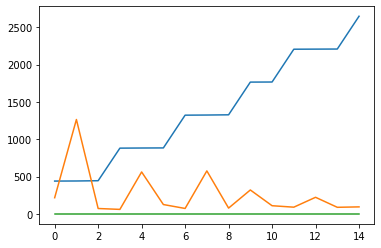

In [70]:
X = readWaveFile("realClarinet440.wav")

simple_spec = getSpectralPeaks(X,50)
plt.plot(simple_spec)

# Your code here
X = makeSignal(simple_spec, duration=2)
A = getAmplitudePlot( X )
Y = applyAmplitudePlot(A, X)

# Let's hear it
Audio(Y,rate=SR)

##  Problem Three:  Frequency Modulation

As discussed in lecture, frequency modulation changes the frequency of the carrier signal, as if it is a vibrato on steroids:  the vibrato frequency can be anything, even larger than the original carrier frequency!

In a simple implementation, the carrier signal has frequency $fc$ and relative amplitude $Ac$, and
the modulator (the vibrato) has frequency $fm$ and $Am$. 

The only difficulty is that when changing the frequency, we have to ensure that the new sine wave will start
at the same phase as the current signal, hence we calculate the instantaneous phase each time. 

In [ ]:
def FM(fc,Ac,fm,Am,duration):
    X = np.zeros(SR * duration)
    phase = 0.0
    newFreq = f1
    for k in range( SR*duration ):
        freqIncr = Am * np.sin(2*np.pi*fm*k/SR)  # modulating signal
        oldFreq = newFreq
        newFreq = fc + freqIncr
        phase +=  2 * pi * (k / SR) * (oldFreq - newFreq)      
        X[k] = Ac*MAX_AMP*np.sin(2*np.pi*newFreq*k/SR + phase)
    return X
    

In order to control and analyze FM, it is useful to consider the *modulation index*, which in this case
means the ratio of the total deviation of the carrier frequency to the modulating frequency:

$$\text{index}\ =\ {\text{Total deviation of carrier frequency}\over \text{Modulator frequency}}\ 
=\ { 2*A2  \over  f2  }.    $$

The modulation index can then be used to calculate the amplitudes (we'll assume A1 = 1.0):

In [ ]:
def FM_index(f1,f2,index, duration):
    X = np.zeros(int(SR * duration))
    phase = 0.0
    newFreq = f1
    for k in range( int(SR*duration) ):
        A2 = f2*index 
        freqIncr = A2 * np.sin(2*np.pi*f2*k/SR)  # modulating signal
        oldFreq = newFreq
        newFreq = f1 + freqIncr
        phase +=  2 * pi * (k / SR) * (oldFreq - newFreq)      
        X[k] = MAX_AMP*np.sin(2*np.pi*newFreq*k/SR + phase)
    return X

fc = 500
fm = 1
index = 500
duration = 6
X = FM_index(fc,fm,index,duration)
Audio(X,rate=SR)

### Part (A)

A common technique to simulate changing spectra (such as exhibited by percussion instruments) is
to gradually reduce the index to 0 during the signal. As John Chowning says in his original paper on
FM:
<blockquote>
 As demonstrated above, the equation for FM has an inherent
and, as will be shown, most useful characteristic: the complexity
of the spectrum is related to the modulation index in such a way
that as the index increases, the bandwidth of the spectrum also
increases (see Fig. 5). If, then, the modulation index were made
to be a function of time, the evolution of the bandwidth of the
spectrum could be generally described by the shape of the
function. <a href="https://ccrma.stanford.edu/sites/default/files/user/jc/fm_synthesispaper-2.pdf">Chowning</a>. 
</blockquote>

We will simply assume that the index changes in a linear slope between an initial value and a final value. Rewrite the code by adding/changing a couple of lines to make the
index progress in a linear fashion at each sample to the final index. Hint: check out
`np.linspace`. 

In [18]:
def FM_mod_index(f1,f2,init_index, final_index, duration):
    N = int(SR * duration)
    X = np.zeros(N)
    phase = 0.0
    newFreq = f1
    index = np.linspace(init_index, final_index, N)
    for k in range( N ):
        A2 = f2*index[k] 
        freqIncr = A2 * np.sin(2*np.pi*f2*k/SR)  # modulating signal
        oldFreq = newFreq
        newFreq = f1 + freqIncr
        phase +=  2 * pi * (k / SR) * (oldFreq - newFreq)      
        X[k] = MAX_AMP*np.sin(2*np.pi*newFreq*k/SR + phase)
    return X



fc = 220
fm = 220
index = 10
duration = 3
X = FM_mod_index(fc,fm,index,0,duration)
Audio(X,rate=SR)

These examples are from http://sites.music.columbia.edu/cmc/MusicAndComputers/chapter4/04_07.php

Nothing to do here except to check out these sounds!

In [19]:
# Bell sound

fc = 100
fm = 280
index = 6
duration = 5
X = FM_mod_index(fc,fm,index,0,duration)
Audio(X,rate=SR)

In [20]:
# Bass-Clarinet or a gong?

fc = 250
fm = 175
index = 2
duration = 1
X = FM_mod_index(fc,fm,index,0,duration)
Audio(X,rate=SR)

In [21]:
# trumpet 

fc = 700
fm = 700
index = 5
duration = 0.5
X = FM_mod_index(fc,fm,index,0,duration)
Audio(X,rate=SR)

In [22]:
# woodwinds

fc = 900
fm = 300
index = 2
duration = 0.5
X = FM_mod_index(fc,fm,index,0,duration)
Audio(X,rate=SR)

In [23]:
# FM sound

fc = 500
fm = 100
index = 1.5
duration = 0.5
X = FM_mod_index(fc,fm,index,0,duration)
Audio(X,rate=SR)

In [24]:
fc = 200
fm = 280
index = 10
duration = 15
X = FM_mod_index(fc,fm,index,0,duration)
Audio(X,rate=SR)

In [25]:
fc = 200
fm = 280
duration = 5
X = FM_mod_index(fc,fm,1,10,duration)
Audio(X,rate=SR)

### Part (B)

Essentially the only *data structure* in this course is a **signal**, i.e.,
a list or array of values representing a *time sequence*. Therefore it
should not be surprising that the slope of the amplitude of a signal,
or the index in FM, could be controlled by a linear "envelope" or by
any other envelope (envelopes being, of course, signals). 

Complete the following templates to create a function which uses an `index_envelope`
to control the change to the index over the duration of the signal. 

In [36]:
# I found this helper function to be useful: in the synthesis
# function in the following cell, you can take the index envelope
# and simply resample it to the length of the signal and then
# use it to control the amplitude A2 in the loop. 

# You'll also use this in the next problem!   Two birds with one stone.....

def resample(X,M):
    sample = []
    N = len(X)
    T = np.arange(N)
    f = interp1d(T, X, kind = 'quadratic')
    T1 = np.linspace(0, N - 1, M)
    for t in T1:
        sample.append(float(f(t)))
    return sample

# test
print( resample( [1,2,3,4], 4 ) )
# [ 1.  2.  3.  4.]
print( resample( [1,2,3,4], 3 ) )
# [ 1.   2.5  4. ]
print( resample( [1,2,3,4], 7 ) )
# [ 1.   1.5  2.   2.5  3.   3.5  4. ]

[1.0, 2.0, 3.0, 4.0]
[1.0, 2.5, 4.0]
[1.0, 1.5000000000000002, 2.0, 2.5, 3.0, 3.5, 4.0]


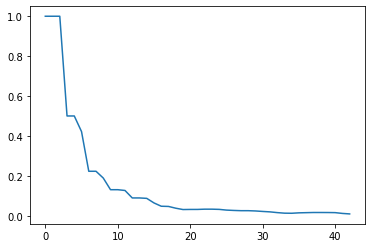

NameError: name 'new_envelope' is not defined

In [72]:
def FM_env_index(f1,f2,index, index_envelope, duration): 
    
    X = np.zeros(int(SR * duration))
    phase = 0.0
    newFreq = f1
    envelope = resample(index_envelope, int(SR*duration))
    for k in range( int(SR*duration) ):
        A2 = f2*new_envelope[k]*index 
        freqIncr = A2 * np.sin(2*np.pi*f2*k/SR)  # modulating signal
        oldFreq = newFreq
        newFreq = f1 + freqIncr
        phase +=  2 * pi * (k / SR) * (oldFreq - newFreq)      
        X[k] = MAX_AMP*np.sin(2*np.pi*newFreq*k/SR + phase)
    return X
    


# test
A = getAmplitudePlot( readWaveFile('bell.wav') )
plt.plot(A)
plt.show()

fc = 2000
fm = 2800
index = 10
duration = 5
X = FM_env_index(fc,fm,index,A,duration)
Audio(X,rate=SR)

## Problem Four:  WaveTable Synthesis

A *wave table* is simply a signal (*everything* is a signal, remember?) stored in an array (or a file)
that can be used to generate samples instead of calculating them in real time. 

Since the wave table has a fixed fundamental frequency, we need to "stretch" or "shrink" the signal, typically,
to get different frequencies. This will be done using interpolation, as in Problem One (review Appendix A as needed). 



### Part (A):  Pitch and duration modulation using resampling

Essentially, interpolation is trying to imitate what would happen if we went back 
to the original sound and recorded it at another sample rate.  When we do this,
and then use the modified signal at the normal SR, then we have stretched or shrunk
the signal by resampling. The effect, if we listen to it, is to 

- slow down the audio signal and lower the frequency if we increase the number of samples; or
- speed up the audio signal and raise the frequency if we decrease the number of samples.

In other words, the duration and the frequency are *locked* in an inverse relationship. Unlocking this
relationship will be an interesting problem we shall consider next week. 

You have written the `resampling` function above, which will be essential to this
new task. 

### Part (A)

I would like you to investigate speeding up and slowing down the the `bell.wav`
signal at different rates:

- Resampled at the exact same rate (meaning, input the length of the original signal)
- Resampled at 2 x original rate  (= 2 * length of original)
- Resampled at 3.56 x original rate
- Resampled so that the pitch drops by 2 octaves

Display the signal and listen to it using `Audio`. 

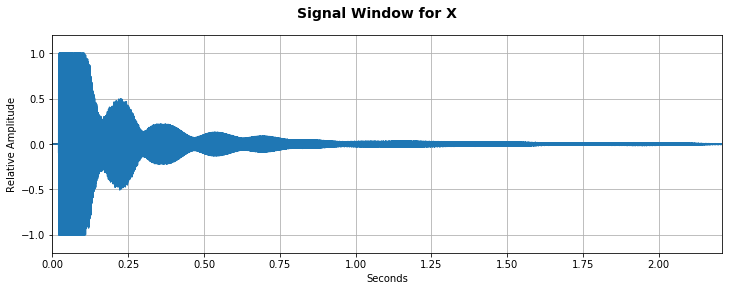

In [37]:
X = readWaveFile('bell.wav')
X = clip(X)
N = len(X)

displaySignal(X)
Audio(X,rate=SR)

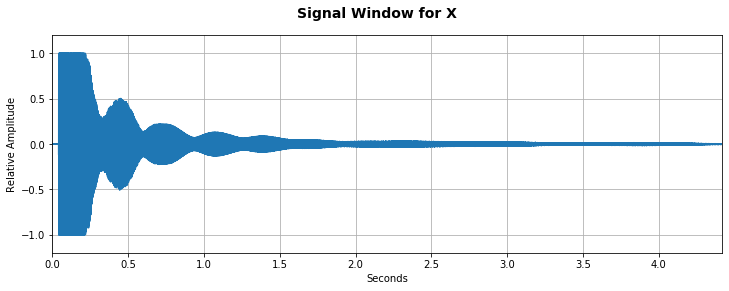

In [38]:
# Your code here
X1 = resample(X, 2 * N)
X1 = clip(X1)
displaySignal(X1)
Audio(X1, rate = SR)

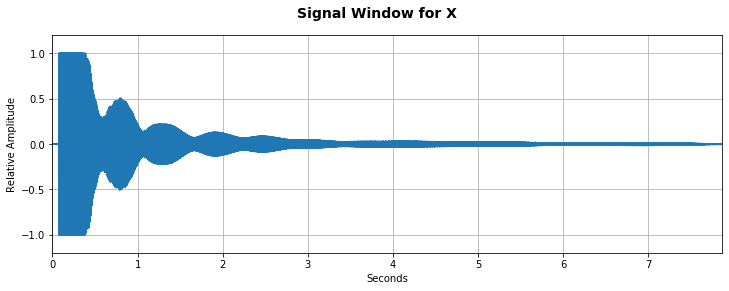

In [39]:
# Your code here
X2 = resample(X , 3.56 * N)
X2 = clip(X2)
displaySignal(X2)
Audio(X2, rate = SR)

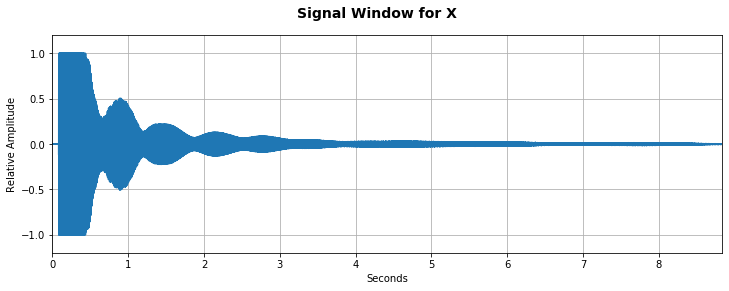

In [40]:
# Your code here
X3 = resample(X , 4 * N)
X3 = clip(X3)
displaySignal(X3)
Audio(X3, rate = SR)

### Part (B) ReSCALING a Signal

Unfortunately, `resample` only works when converting a signal of length N to
a signal of length M, for M and N integers.  How do we stretch or
shrink a signal by a real number, say to convert a signal with frequency 440
to 261.6256 (middle C)?   The answer is: by using an interpolation function
as the wave table!

The first task is to read through an understand how the WaveTable class works;
then you must write a function waveTableSynth which uses this to scale
a signal by an arbitrary amount. 

Then, as "proof of concept", you will show that you can create a clarinet note of any
length and at any pitch on the piano keyboard.  It should use the clarinet signal
`realClarinet440.wav` to extract a wavetable of a basic clarinet sound, and then apply
the techniques from hw 01 to apply an ADSR envelope consistent with the overall maximum
amplitude and the length of the note. 

I include the ADSR function from HW 01; complete the template in the
following cell marked "Your Turn!" and then create the clarinet note
as specified. 

#### WaveTable data structure

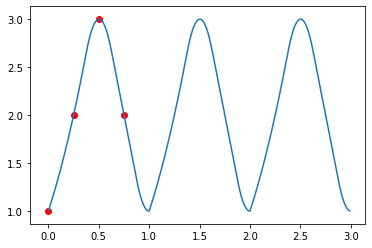

In [41]:
# This class creates a wave table from  a sound sample X containing at least
# one full period of the fundamental frequency f of the sound sample; you must
# give the signal, the sample rate, and the frequency represented.  

# g(t) with t in seconds will return the amplitude of the wave table signal
# as if it were infinite: note that (t % period), using floating-point modulus
# will route the reference to the appropriate place in the first oscillation 
# of the signal. 

from math import fmod

class WaveTable:

    # Create interpolation function g which is a continuous
    # version of the wave table signal in X
    
    def __init__(self, X1,f,rate=SR):
        self.period = rate/f            # period is in units of samples
        self.rate = rate
        self.g = interp1d(np.arange(len(X1)), X1, kind='quadratic') 

    # instance method to return amplitude of signal X at time t
    def get(self,t):
        return self.g( fmod( t*self.rate, self.period ) )     # only look in first period
    
#test
X = [1,2,3,2,1,2,3]
wt = WaveTable(X,1,4)                                 # sample rate is 4/sec, frequency is 1/sec
Y = [ wt.get(t) for t in np.arange(0,3,0.01)]   # 0 to 3 secs in 1/100 intervals

plt.plot(np.arange(0,3,0.01),Y)
plt.scatter([0/4,1/4,2/4,3/4],[1,2,3,2],color='r')
plt.show()

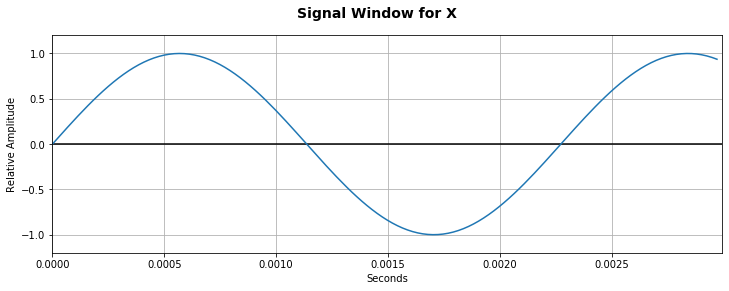

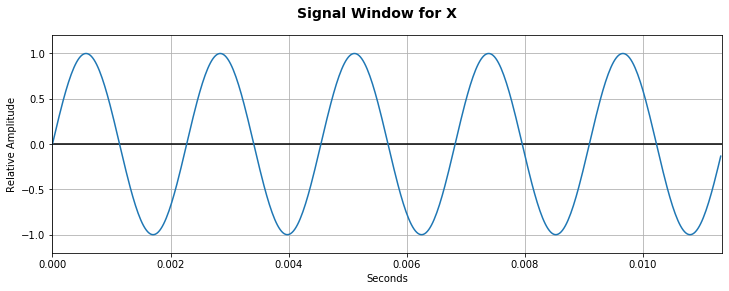

In [55]:
# Example

X = makeSignal([(440,1,0)],duration=0.003)             # 20 Hz, 1 second long
displaySignal(X)
wt = WaveTable(X,440)                               # sample rate is 44100, frequency is 440 Hz
Y = [ wt.get(t) for t in np.arange(0,4,1/SR)]   # 0 to 3 secs 

displaySignal(Y[:500])

#### Your turn!  

Complete this template to synthesize a new signal of a given
frequency from the wave table. 

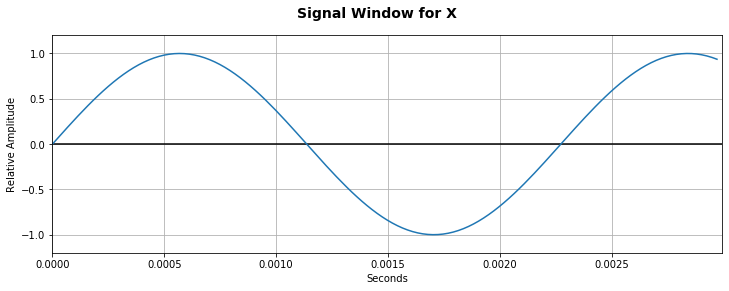

In [52]:
# WT is the actual wave table signal and f is the frequency in the wavetable
# f1 is the new frequency, and dur is the length in seconds of the new signal. 

# Hint: You must scale time by the factor r = f1/f to reference the wave table
#       Keep track of the units!  You are creating a signal in terms of samples,
#       but must input time in seconds to wave table function get(...). 

def waveTableSynth(W,f,f1,dur=1.0):
    #extract points from W to create sine wave outline
    wt = WaveTable(W, f)
    r = f1 / f  
    sig = np.zeros(int(SR * dur))
    
    for xval in range(len(sig) - 1):
        t = xval / SR
        sig[xval] = wt.get(t * r)
        
    return sig

# test with previous example
X = makeSignal([(440,1,0)],duration=0.003)             # 20 Hz, 1 second long
displaySignal(X)
wt = waveTableSynth(X,440,440,3.0)                               # sample rate is 44100, frequency is 440 Hz


FINALLY, create a wave table from the real clarinet signal as shown,
then create a signal for a clarinet note with frequency 'C4' (middle C),
2 seconds long, and following the clarinet envelope created above. 
Provide a call to `Audio` so we can listen to it!

In [60]:
# solution

wt = WaveTable(readWaveFile("realClarinet440.wav"),261.63,2) 
X = waveTableSynth(wt, 261.63, 2)
displaySignal(X)
Audio(X, rate = SR)

TypeError: object of type 'WaveTable' has no len()

## Problem Five:  Reverberation

Please read carefully Appendix Two on the matter of digital filters and covolution. 
For this problem, you will use convolution to create interesting reverberation effects. 


### Convolution Reverb

When such an impulse response is convoluted with a signal, then every amplitude "spike" in the signal is subjected to the "dying away" of the energy as specified very precisely by the impulse response.

**Punchline:  Convoluting a musical signal with the impulse response of a "sonic space" such as
a cathedral or a jazz club will make it sound like the music is playing in that space!**

Here is an example, the Bach G-Minor Fugue for organ, played in the Batcave...

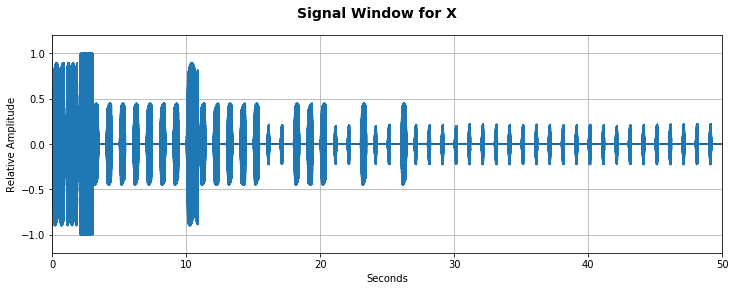

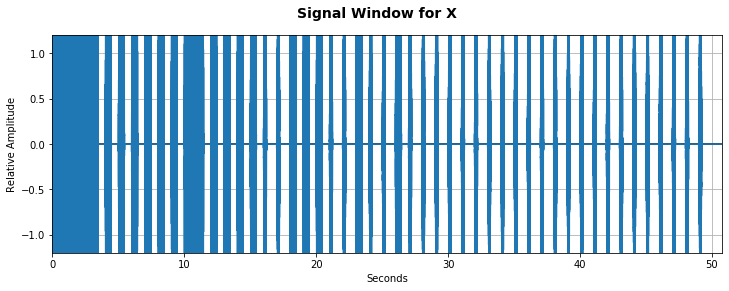

In [57]:
X = readWaveFile('BachOrganFugue.wav')
displaySignal(X)
Audio(X,rate=SR)

from numpy import convolve

X = readWaveFile('BachOrganFugue.wav')
Ir = readWaveFile('batcave.wav')
Ir = scaleSignal(Ir,1.0)

Xreverb =  np.convolve(Ir,X) 

displaySignal(Xreverb)
Audio(Xreverb,rate=SR)

Here is an interesting site giving advice (and links) about getting free impulse responses to use
in convolution reverb:

https://www.reasonstudios.com/blog/free-reverb-resources-where-to-find-impulse-responses

I have also linked an <a href="http://www.cs.bu.edu/fac/snyder/cs583/Homeworks/ImpulseResponses/">Impulse Responses Directory</a> from the main web page for the class. 

#### Your turn!

Take one of the examples of a musical melody or piece from hw 01, an impulse
response from the library linked in the Useful Links section of the class
web page (NOT the batcave), and add reverb to your melody. 

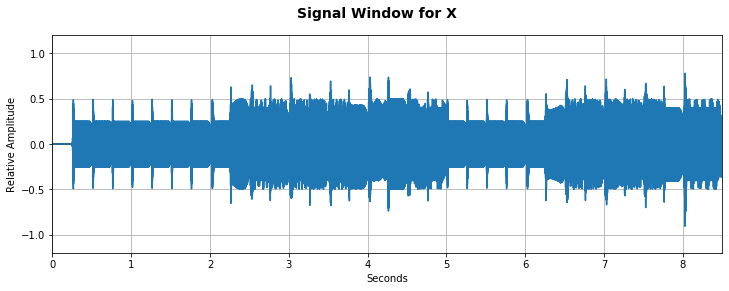

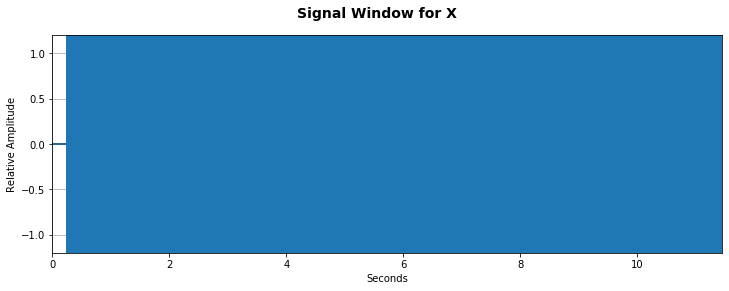

In [69]:
# Solution
# from HW1

def makeMelody(melody,instrument,envelope):
    # Your code here
    
    #signaler = lambda note, amp, duration: makeSpectrum(instrument, Freqs[notename])
    X =[]
    for (notename, amp, duration) in melody:
        if notename == "R":
            rest = np.zeros(int(duration*SR))
            X.append(rest)
        else:    
            sig = makeSignal(makeSpectrum(instrument, Freqs[notename]), amp, duration)
            sig = applyADSR(envelope, sig)
            X.append(sig)
            #X = np.concatenate((X, sig), axis = None)
    return np.concatenate(X)


def applyADSR(envelope, X):
    (A,D,S,R,L,H) = envelope
    N = len(X)
    
    # convert units from relative(percentage) to sample count
    A = int(A*N)        #attack phase amplitudes over time         
    D = int(D*N)        #decay
    S = int(S*N)        #sustain
    R = N - (A+D+S)     #release, to make sure floating point arith didn't screw up the count
        
    # Your code here
    attackamps = np.linspace(0, 1, A)           #create attack subarray
    expattack = np.array([a**2 for a in attackamps])
    decayamps = np.linspace(1,L, D)             #create decay subarray 
    sustainamps = np.linspace(L,L, S)            #create sustain subarray
    
    halflifetime = np.arange(R)      #just time, gotta figure out shape
    Hsamples = H * SR
    relamps = np.array([L*((.5)**(t/Hsamples)) for t in halflifetime]) # hopefully decay rate lol
    ADSR = np.concatenate((expattack, decayamps, sustainamps, relamps), axis = None)
    return ADSR*X 


invention_treble = [ ('R',0,1/4),    ('C4',1/2,1/4),  ('D4',1/2,1/4), ('E4',1/2,1/4), 
              ('F4',1/2,1/4), ('D4',1/2, 1/4), ('E4',1/2,1/4), ( 'C4',1/2,1/4),
              ('G4',1/2,1/2),                  ('C5',1/2,1/2),
              ('B4',1/2,1/2),                  ('C5',1/2,1/2),
              ('D5',1/2,1/4), ('G4',1/2,1/4),  ('A4',1/2,1/4), ('B4',1/2,1/4),         
              ('C5',1/2,1/4), ('A4',1/2,1/4),  ('B4',1/2,1/4), ('G4',1/2,1/4),           
              ('D5',1/2,1/2),                  ('G5',1/2,1/2),
              ('F5',1/2,1/2),                  ('G5',1/2,1/2), 
              ('E5',1/2,1/2)
            ]

invention_bass = [ ('R',0,2),    
              ('R',0,1/4),    ('C3',1/2,1/4),  ('D3',1/2,1/4), ('E3',1/2,1/4), 
              ('F3',1/2,1/4), ('D3',1/2, 1/4), ('E3',1/2,1/4), ( 'C3',1/2,1/4),
              ('G4',1/2,1/2),                  ('G3',1/2,1/2),
              ('R',0,1), 
              ('R',0,1/4), ('G3',1/2,1/4),  ('A3',1/2,1/4), ('B3',1/2,1/4),         
              ('C4',1/2,1/4), ('A3',1/2,1/4),  ('B3',1/2,1/4), ('G3',1/2,1/4),           
              ('C4',1/2,1/2)   
            ]


X1 = makeMelody(invention_treble,'clarinet',(0.06,0.04,0.8,0.1,0.5,0.1))
X2 = makeMelody(invention_bass,'clarinet',(0.06,0.04,0.8,0.1,0.5,0.1))
X = X1 + X2

Ir = readWaveFile('caslobby.wav')
Ir = scaleSignal(Ir)
X2 =  np.convolve(Ir,X) 

displaySignal(X)
displaySignal(X2)
Audio(X2,rate=SR)

## Problem Six:  Your turn to do something creative!

This problem is due to Ellison, I'm going to do it along with you all!

For this problem, you need to work with the second notebook file, hw02b.ipynb. 
Please complete both notebooks and hand in to Gradescope in one week. 



## Appendix A:  Interpolation

As discussed in lecture, when we have a graph (or a signal) and we need to *resample* to get additional
points not in the data, or to eliminate points, we will use the function `interp1d` from the `scipy.interpolate` library: 

https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.interp1d.html#scipy.interpolate.interp1d


The essential idea is that you give it a sequence of points, and it returns a *function* which matches all the points, but also calculates a smooth curve throughout all points, including the first and last values, according to linear, quadratic, or cubic interpolation (there are other tweaks you can make, but these three are the most useful). 

The following example illustrates all you need to know. Just remember that you can only interpolate between the low and high values (inclusive) on the x axis, but can find an interpolate value for any floating-point number between these two values. 

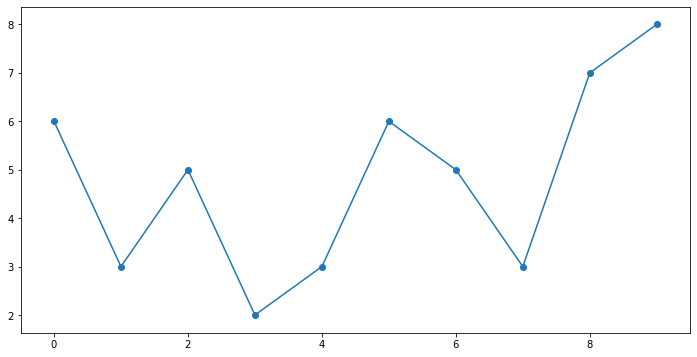

In [36]:
from scipy.interpolate import interp1d

X = [0,1,2,3,4,5,6,7,8,9]            # low x value = 0 and high x value = 9
Y = [6,3,5,2,3,6,5,3,7,8]

plt.figure(figsize=(12,6))
plt.plot(X,Y)
plt.scatter(X,Y)
plt.show()

[0.5 1.5 2.5 3.5 4.5 5.5 6.5 7.5 8.5]


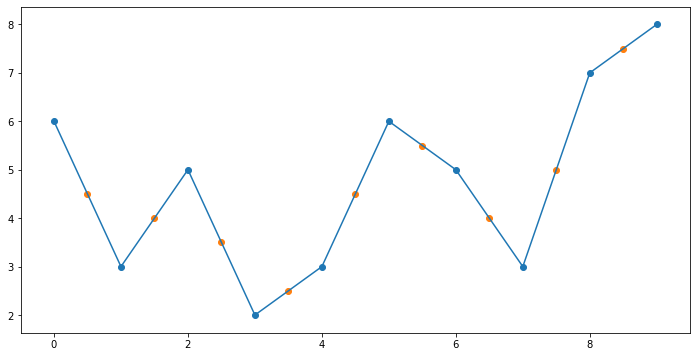

In [37]:
f = interp1d(X,Y)            # default is linear interpolation
X1 = np.linspace(0.5,8.5,9)     # interpolation is in the range [0..9] for x values
print(X1)

plt.figure(figsize=(12,6))
plt.plot(X,Y)
plt.scatter(X,Y)
Y1 = f(X1)
# plt.plot(X1,Y1)
plt.scatter(X1,Y1)
plt.show()

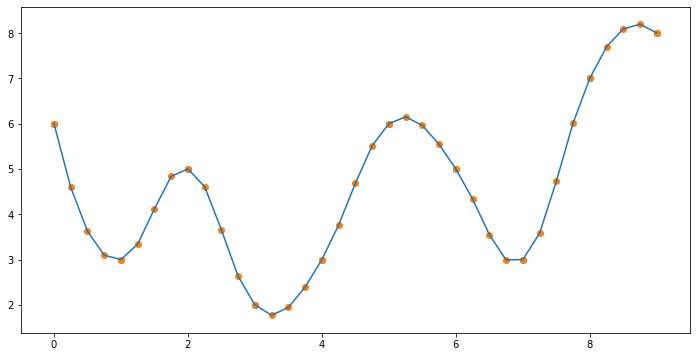

In [39]:
f = interp1d(X,Y,kind='quadratic')       # our default will be quadratic   
X1 = np.linspace(0,9,37)                 # interpolation is in the range [0..9] for x values

plt.figure(figsize=(12,6))
#plt.plot(X,Y)
plt.scatter(X,Y)
Y1 = f(X1)
plt.scatter(X1,Y1)
plt.plot(X1,Y1)
plt.show()

## Appendix B: Digital Filters, Smoothing, Convolution, and Reverberation

A *digital filter* is any algorithm which takes a signal $X$ and a sequence of $k$ weights $W = [w_{0},\ldots, w_{k-1}]$, and for any sample $X[i]$, outputs a new signal which represents the weighted average of subsequences of $X$:

$$Y[i]\ =\ w_{0}\cdot X[i-k] \quad + \quad \cdots\quad  + \quad {w_{k-1}\cdot X[i]}$$
 
 
If the signal is a time series, this means you are taking the weighted average of the signal in the context of
some number of past values (or, with some massaging, past and future values). 

Note that this is the dot product of two sequences!

Here is a 2D view of the calculation of the output values for the given values of X and W, which shows
that at the boundaries, only a partial weighted sum can be performed, since the overlap between X and W
does not cover all of W:

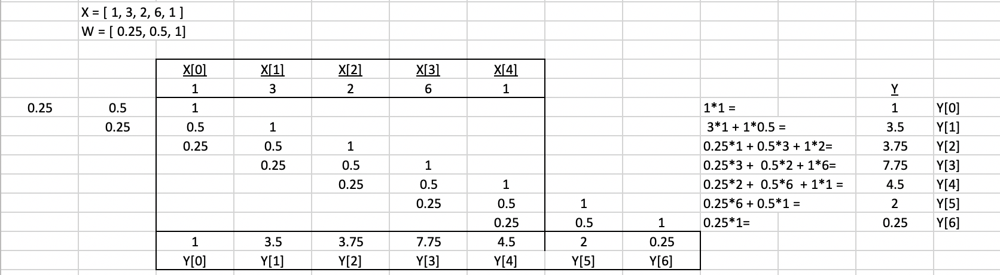
 

When used to smooth a time series, the values of all the $w_i$ terms are the same (i.e., ${1\over k}$), and it is called a Moving or Rolling Average, sometimes with the parameter $k$ made explicit, as the "rolling 7-day average" in graphs such as the following (so $k=7$):

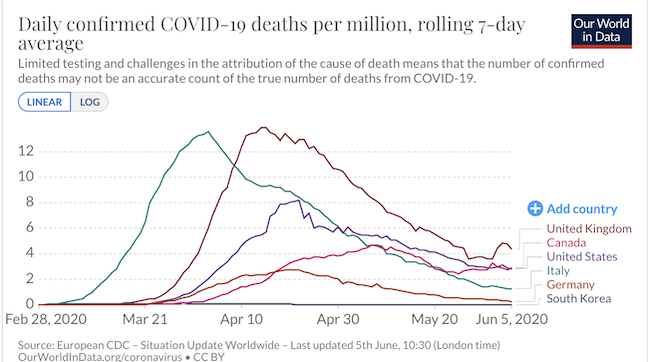

Under the name Exponentially Moving Average, the weights decrease exponentially to account for the exponential
decrease in the effect of some measured quantity over time.  It is common in finance and many other fields:

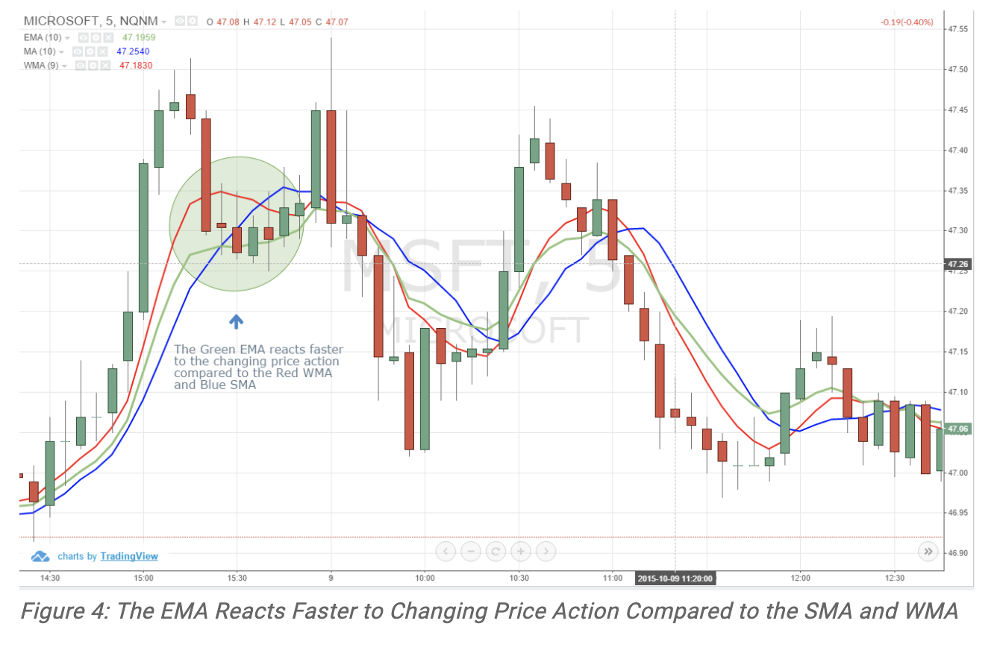



### Implementing a Digital Filter

A naive (i.e., not efficient) implementation of a digital filter is fairly straightforward, especially because of its similarly to the *sliding window* technique shown in Problem One,  except at the boundaries at the beginning and
the end of the signal, where the vector of weights does not fully overlap the signal. There are several *modes* for dealing with this, the simplest of which is
to allow any possible non-empty overlap to produce a value. This is called *full mode*; to implement this we pad
the signal with $k-1$ 0's at the beginning and at the end, producing a filtered signal which is longer by $k-1$ points. 

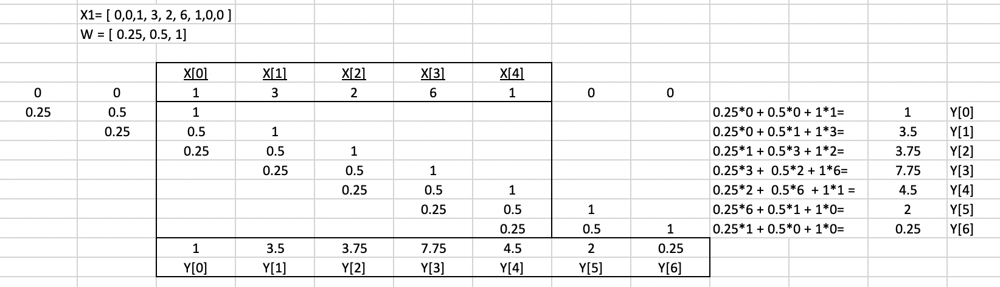

In [58]:
def digitalFilter(X,W):
    
    k =  len(W)
    
    # pad X with k-1 zeros at each end to deal with partial windows at beginning and end   
    
    X1 = np.concatenate( [ np.zeros(k-1), X, np.zeros(k-1) ] )
    
    return [ np.dot(W,X1[i:(i+k)])   for i in range(len(X1)-k+1) ]



X = [1,2,3,2]
T= np.arange(len(X))
W = [1/3, 1/3, 1/3 ]
Z = np.zeros( len(W)-1 )         
Xpadded = np.concatenate([Z,X,Z])

print('X:\t', X)
print('W:\t', round4(W))
print('Xpadded:', Xpadded)

X1 = digitalFilter(X,W)
print('X1:\t',round4(X1))

X:	 [1, 2, 3, 2]
W:	 [0.3333 0.3333 0.3333]
Xpadded: [0. 0. 1. 2. 3. 2. 0. 0.]
X1:	 [0.3333 1.     2.     2.3333 1.6667 0.6667]


In some cases, we wish to have a result in which the boundary conditions at the beginning or end are
modified in some way. We might also want to allow a weight vector which uses (say) $m$ past values and
$n$ future values, so $W$ has $k=n+m+1$ values:


$$Y[i]\ =\ w_{0}\cdot X[i-m] \quad + \quad \cdots\quad  + \quad \underline{{w_{m}\cdot X[i]}} + \quad \cdots\quad  + \quad     w_{k}\cdot X[i+n] $$

Notice carefully that $X[i]$ is being combined with $m$ past values and $n$ future values to
create the output $Y[i]$, so in the (usual) case that $m=n$, then this weighted vector is
**centered** around a value $X[i]$. This is the meaning of the *Rolling 7-Day Average* mentioned above,
and which we now explore in detail. 

### K-Point Moving Average
 
A digital filter can easily implement a *K-Point Moving Average*, in which $m=n$ and so $k$ is the odd number $2n+1$,
and the weight vector is moved to align the midpoint with each of the signal points in turn; the
boundary effects are mitigated but not completely eliminated (since you are still using partial windows
at the beginning or the end). 

To obtain a moving average centered in $W$, it must have odd length $k$ and be precisely the following:

$$W\ =\ [{1 \over k}, {1 \over k}, ..., {1 \over k} ].$$

We will **only allow results calculated when the center of the weight vector is inside the signal** 
we can simply trim $(k-1)/2$ points from the beginning and from the end of the result, 
effectively *centering* the weight vector around the average value being produced at each
slide of the window.  This is called *same mode* since the output is the same length as the input
(often an advantage when dealing with audio signals-- we don't want to make the signal longer or shorter,
just modify it in place). 

Here is an example. 

In [ ]:
X = [-3, 0,  3, 0, -3, 0,  3, 0,-3, 0,  0, 0, 3, 3, 3, 0, 0]
T= np.arange(len(X))
W = [1/3, 1/3, 1/3 ]
k = len(W)
excess = int((k-1)/2)
# Z = np.zeros( len(W)-1 )         
# Xpadded = np.concatenate([Z,X,Z])
# Tpadded = np.arange(len(Xpadded))

M = digitalFilter(X,W)
Mtrimmed = M[excess:-excess]

# print(len(X))
# print('X',(X))
# print(len(Xpadded))
# print((Xpadded))
# print(len(M))
# print('M',(M))
# print(len(Mtrimmed))
# print('M trimmed',(Mtrimmed))

plt.figure(figsize=(16,8))
plt.title("3-Point Moving Average")
plt.ylim([-5,5])
plt.plot(T,X,color='b',label="Original Signal")
plt.scatter(T,X,color='b',)
plt.plot([0,len(T)],[0,0],color='k',alpha=0.2)
plt.plot(T,Mtrimmed,color='r',label="3-Point MA")
plt.scatter(T,Mtrimmed,color='r',)
plt.legend()
plt.show()


### Weighted Moving Average

Of course, we can also do exactly the same thing, but not take the average (where all weights are equal), but
use a weighted sum, similar to a mean or expected value in probability theory. Again, in this case,
we will trim values from the output, since we are in this case interested in weight vectors of odd length centered on the index being output.  

The following example should clarify that any weights whatsoever can be used in the weight vector! 

In [ ]:
X = [-3, 0,  3, 0, -3, 0,  3, 0,-3, 0,  0, 0, 3, 3, 3, 0, 0]
T= np.arange(len(X))
W = [0.2, 0.7, 0.1 ]
k = len(W)
excess = int((k-1)/2)
# Z = np.zeros( len(W)-1 )         
# Xpadded = np.concatenate([Z,X,Z])
# Tpadded = np.arange(len(Xpadded))

M = digitalFilter(X,W)
Mtrimmed = M[excess:-excess]

# print(len(X))
# print('X',(X))
# print(len(Xpadded))
# print((Xpadded))
# print(len(M))
# print('M',(M))
# print(len(Mtrimmed))
# print('M trimmed',(Mtrimmed))

plt.figure(figsize=(16,8))
plt.title("3-Point Weighted Sum: "+str(W))
plt.ylim([-5,5])
plt.plot(T,X,color='b',label="Original Signal")
plt.scatter(T,X,color='b',)
plt.plot([0,len(T)],[0,0],color='k',alpha=0.2)
plt.plot(T,Mtrimmed,color='r',label="3-Point WS")
plt.scatter(T,Mtrimmed,color='r',)
plt.legend()
plt.show()

### Exponential Moving Average

The *Exponential Moving Average* is another common digital filter (our first example above!), used in  fields as diverse as finance and computer networking. In this case, we are modeling the exponential decrease in the effect of a sample in the signal.
In audio this can be used to model the exponential decay in the release phase of an ADSR envelope,
and also environmental effects ("room acoustics") such as echo and reverberation.

In an EMA, the weight vector W contains a decreasing exponential (alternately, a geometric) series,
where each weight successively decreases by a factor $0<d<1$ from right to left.

For example, if $W = [0.25, 0.5, 1.0]$ with d = 0.5 then the effect of each sample will halve over each of the next 2 samples:

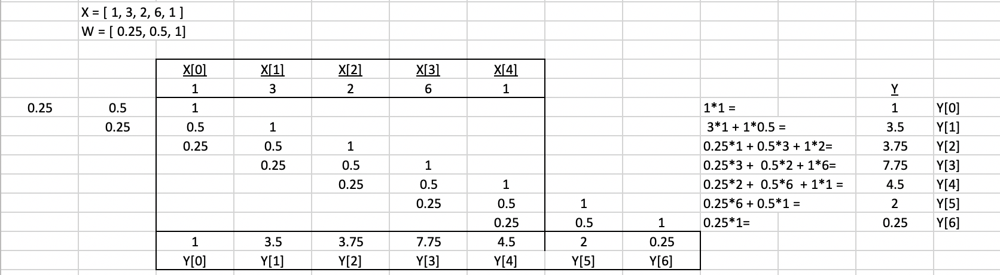
       
In this case, the *extra* samples at the end mean something: the effect of the filter extends past the end
of the signal, since each sample has an effect up to two samples later. 

If the filtered signal has to be the same length as the original, then you can simply delete `len(W)-1` samples
from the end. 
       

In [ ]:
X = [-3, 0,  3, 0, -3, 0,  3, 0,-3, 0,  0, 0, 3, 3, 3, 0, 0]
T = np.arange(len(X))
W = [0.25, 0.5, 1.0]
X1 = digitalFilter(X,W)
T1 = np.arange(len(X1))

plt.figure(figsize=(16,8))
plt.ylim([-5,6])
plt.title("Original Signal")
plt.plot(T,X,color='b',label="Original Signal")
plt.scatter(T,X,color='b',)
plt.plot([0,len(X)],[0,0],color='k',alpha=0.2)

plt.plot(T1,X1,color='r',label="EMA: d = 1/2")
plt.legend()
# plt.scatter(T,M1,color='g',label="k=1, 3-point MA")

### Convolution

Convolution is one of the most significant algorithms in digital signal processing 
(after the Fast Fourier Transform), and it is defined *almost* precisely as the `digitalFilter` function
above, with the following important exception:

     Convolution ==  digitalFilter with the weight vector W reversed
     
We will explain the technical reason for this below, but for now, let us just explore
the `convolve` function provided by `scipy.signal`; depending on how you set the parameter `mode` it
will provide for the functionality discussed above:

- with `mode` = `full` (the default) it will slide the (reversed) weight vector W across the signal, producing
a weighted sum for *any* overlap of W and the signal; the output will be longer than the input by `len(W)-1` values. 
- with `mode` = `same` the output is the same size as the input signal, centered with respect to the ‘full’ output; effectively this provides for a weighted moving average centered in $W$, as discussed above; and
- with `mode` = `valid` it will output only overlaps which fit completely within the signal; the output will be shorter than the original signal.  

Punchline: Follow the examples below, and use full mode for EMA (perhaps trimming from the end if you
need the filtered signal to be the same length as the original) and use same mode for WMA.

In [ ]:
from numpy import convolve

X = [1,2,3,4]
T= np.arange(len(X))
W = [1/3, 1/3, 1/3 ]

print(round2(digitalFilter(X,W)))

Wrev = W[::-1]         # Pythonistic way to reverse an array -- and yes, I understand it didn't need it in this case....

print(round2(convolve(X,Wrev,mode='full')))
print(round2(convolve(X,Wrev,mode='same')))
print(round2(convolve(X,Wrev,mode='valid')))

In [ ]:
X = [1,     3,     2,     6,     1 ]
W = [1.0,0.5, 0.25]                       # Ok, let's just reverse it from the beginning.....      

print(convolve(X,W,mode='full'))
print(convolve(X,W,mode='valid'))
print(convolve(X,W,mode='same'))

### Why the heck does convolution need W to be reversed??

Simply put: *because W is a signal*.  Just about everything in signal processing
is a signal, because any time series is a signal, as long as you consider time
as occurring in 44,100 "ticks" per second. 

More to the point, interesting things happen when we convolute two signals together,
especially if one is an *impulse response*.  An Impulse Response is the audio signal
that results when a system (such as a room or concert space) receives a short "spike" amplitude, such
as the signal

$$X = [0,0,0,0,32767,0,0,0,0,0,.... ]$$

The audio signal which results when this spike (produced in practice using a cap gun or
by popping a baloon) gives the "acoustic signatured" of the space.  For example, here
is the impulse response of the original "Bat Cave" used in the original Batman TV series:

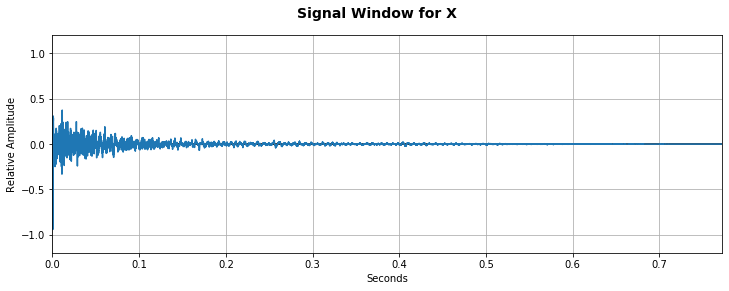

In [59]:
Ir = readWaveFile('Batcave.wav')
displaySignal(Ir)
Audio(Ir,rate=SR)

### Convolution Reverb

When such an impulse response is convoluted with a signal, then every amplitude "spike" in the signal is subjected to the "dying away" of the energy as specified very precisely by the impulse response.

**Punchline:  Convoluting a musical signal with the impulse response of a "sonic space" such as
a cathedral or a jazz club will make it sound like the music is playing in that space!**

Here is an example, the Bach G-Minor Fugue for organ, played in the Batcave...

In [ ]:
X = readWaveFile('BachOrganFugue.wav')f
displaySignal(X)
Audio(X,rate=SR)

In [ ]:
from numpy import convolve

X = readWaveFile('BachOrganFugue.wav')
Ir = readWaveFile('batcave.wav')
Ir = scaleSignal(Ir,1.0)

Xreverb =  np.convolve(Ir,X) 

displaySignal(Xreverb)
Audio(Xreverb,rate=SR)

Here is an interesting site giving advice (and links) about getting free impulse responses to use
in convolution reverb:

https://www.reasonstudios.com/blog/free-reverb-resources-where-to-find-impulse-responses

I have also linked an <a href="http://www.cs.bu.edu/fac/snyder/cs583/Homeworks/ImpulseResponses/">Impulse Responses Directory</a> from the main web page for the class. 

## Appendix (C)  Karplus-Strong String Simulation Algorithms

These might be useful for something or other....

In [ ]:
# Modified with ring buffer; This goes around the ring clockwise,
# whereas the original goes backward through the array. Either direction
# is fine. 

def KarplusStrongDrum(N, duration, p):
    Q = [randint(-32767,32767) for k in range(N)]
    X = [0] * int(duration*SR)
    curr = 1
    prev = 0
    N = len(Q)
    for k in range(len(X)):
        Q[prev] = (Q[prev]*0.5 + Q[curr]*0.5) 
        if (random() < p):
            Q[prev] = (Q[prev]*0.5 + Q[curr]*0.5) 
        else:
            Q[prev] = -(Q[prev]*0.5 + Q[curr]*0.5) 
        X[k] = round(Q[prev])
        curr = (curr+ 1) % N
        prev = (prev + 1) % N 
    return X

X = KarplusStrongDrum(1000,0.15, 0.8)

Audio(X,rate=SR)


In [ ]:
X = KarplusStrongDrum(200,0.2, 0.1)

Audio(X,rate=SR)

In [ ]:
X = KarplusStrongDrum(200,0.2, 0.2)

Audio(X,rate=SR)

In [ ]:
X = KarplusStrongDrum(200,0.2, 0.4)

Audio(X,rate=SR)

In [ ]:
X = KarplusStrongDrum(200,0.2, 0.6)

Audio(X,rate=SR)

In [ ]:
X = KarplusStrongDrum(200,0.2, 0.8)

Audio(X,rate=SR)

In [ ]:
X = KarplusStrongDrum(200,0.5, 0.95)

Audio(X,rate=SR)